In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
sys.path.append(os.path.realpath('..'))

In [3]:
import numpy as np
import plotly.express as ex
import plotly.graph_objects as go
import pandas as pd
import cache_magic

from numpy import exp

from tracking.motion import ConstantVelocityModel, constant_velocity_models
from tracking.target import ConstantAccelerationTarget, ConstantVelocityTarget, SinusTarget, SingerTarget
from tracking.kalman import kalman_pv
from tracking.evaluation import monte_carlo, rmse, execute, state_residuals
from tracking.kalman.convergence import kalman_gain_pv

from tracking.plot import boxplot_rmse, aggregated_errors, plot_aggregated_errors, plot_error_band
from tracking.util import to_df, as_png

In [4]:
from scipy import stats

Work-around to let Plotly use MathJax to display LaTeX. See [here](https://github.com/microsoft/vscode-jupyter/issues/8131#issuecomment-1589961116) for details.

In [5]:
import plotly
from IPython.display import display, HTML

plotly.offline.init_notebook_mode()
display(HTML(
    '<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
))

# Constant-Velocity Model

## Constant-Acceleration Target

In [6]:
target = ConstantAccelerationTarget()

fig = ex.scatter_3d(target.true_states_df(), x='x', y='y', z='z')
fig.update_traces(marker_size = 1)
fig

## Sample run

Let's take a sample run and inspect it a bit closer. This run was generated with a Constant Acceleration target (`target = ca_0.5`), a Constant Velocity motion model with process noise intensity $0.1$ (`motion = cv_0.1`), assumed measurement noise standard deviation $0.87$ (`R = 0.87`), actual measurement noise standard deviation $0.87$ (`z_sigma = 0.87`), and random generator seed set to $0$. 

In [7]:
targets = ConstantAccelerationTarget(.5)
motion  = constant_velocity_models(.1)
z_sigma = .87
r       = monte_carlo(targets, motion, z_sigma, n=1200, seeds=[0])[0]

We start by plotting true positions and velocity throughout the test run.

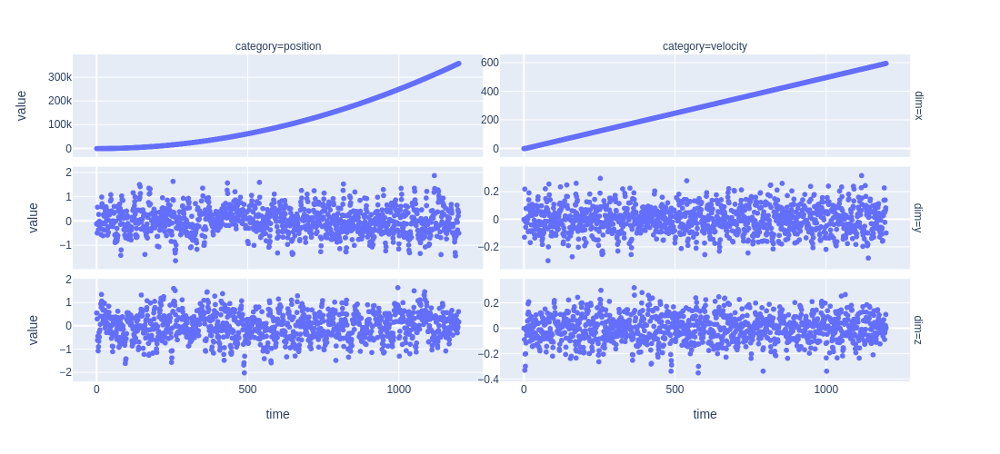

In [8]:
df = r.x_hat_df.melt(id_vars=['time'], var_name='dim')
df['category'] = df.dim.apply(lambda x: 'velocity' if x.startswith('v') else 'position')
df['dim'] = df.dim.apply(lambda x: x[1:] if x.startswith('v') else x)

fig = ex.scatter(df, x='time', y='value', facet_col='category', facet_row='dim')
fig.update_yaxes(matches=None, showticklabels=True)
as_png(fig)

Next, we plot residuals of the Kalman Filter state in time. As expected, after the initial period of larger errors in the `x` dimension, when Kalman Filter converges on the true velocity, residuals seem to oscilate around zero.

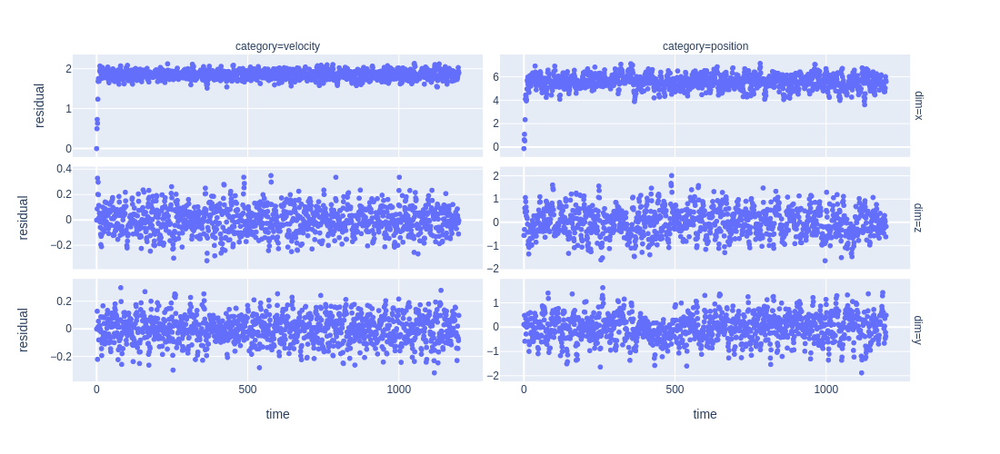

In [9]:
err = state_residuals(r)
fig = ex.scatter(err, x='time', y='residual', facet_col='category', facet_row='dim')
fig.update_yaxes(matches=None, showticklabels=True)
as_png(fig)

We confirm that by plotting the histogram of each error.

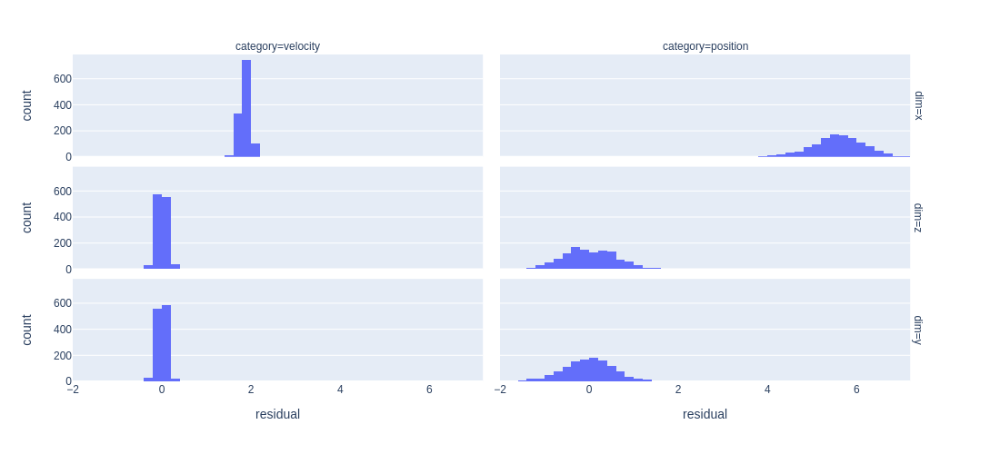

In [10]:
fig = ex.histogram(err, x='residual', facet_col='category', facet_row='dim')
as_png(fig)

Finally, we get rid of the outliers from the initial period.

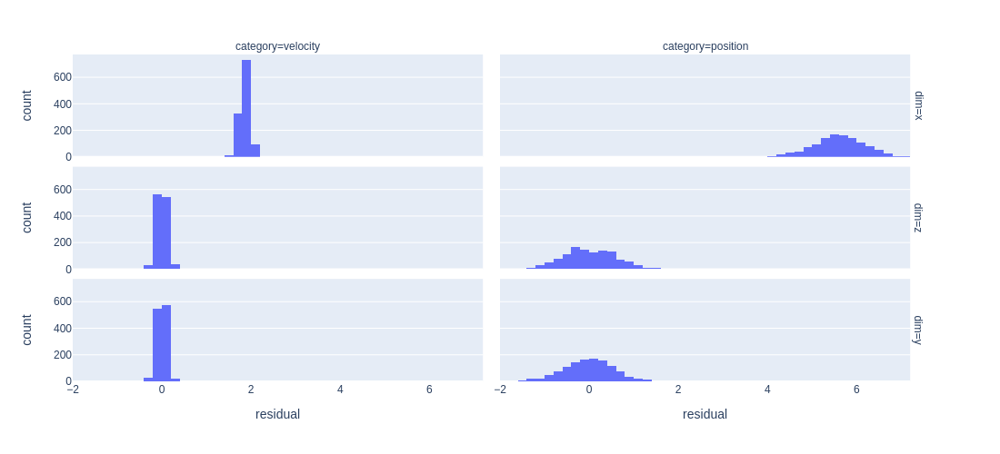

In [11]:
fig = ex.histogram(err.query('time > 30'), x='residual', facet_col='category', facet_row='dim')
as_png(fig)

Let's see if those shapes will look better if let the algorithm run for more than 1200 iterations.

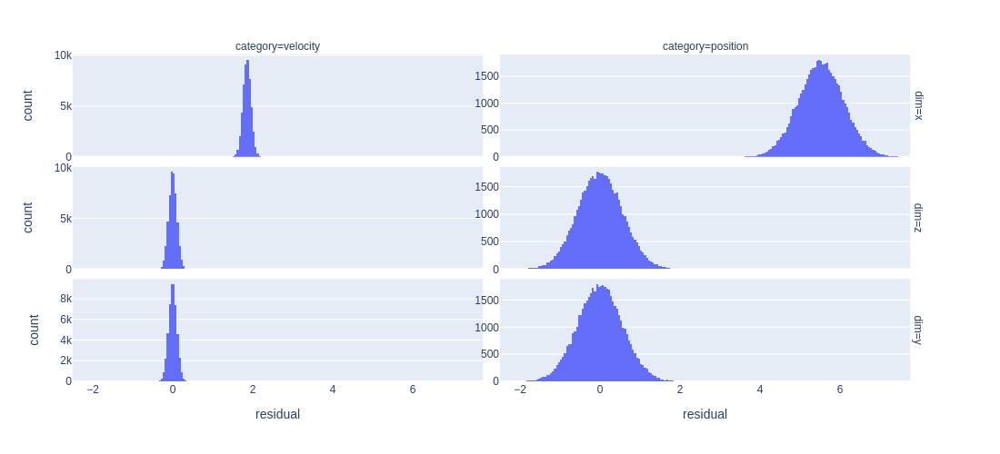

In [12]:
err = state_residuals(execute(r.copy(n=50000)))
fig = ex.histogram(err.query('time > 30'), x='residual', facet_col='category', facet_row='dim')
fig.update_yaxes(matches=None, showticklabels=True)
as_png(fig)

In [13]:
trace = []
for name, group in err.query('time > 500').groupby(by=['category', 'dim']):
    #res = stats.goodness_of_fit(stats.norm, group.residual, statistic='ad', random_state=np.random.default_rng())
    #trace.append(name + (res.pvalue, round(res.fit_result.params.loc, 5), round(res.fit_result.params.scale, 5)))

    loc, scale = np.mean(group.residual), np.std(group.residual, ddof=1)
    cdf = stats.norm(loc, scale).cdf
    res = stats.ks_1samp(group.residual, cdf)

    trace.append(name + (res.pvalue, round(loc, 5), round(scale, 5)))
    
to_df(trace, columns=['category', 'dim', 'pvalue', 'loc', 'scale'])

,category,dim,pvalue,loc,scale
0,position,x,0.9518581176408074,5.52463,0.56566
1,position,y,0.6300782378009183,0.00262,0.5651
2,position,z,0.5959799458208951,0.00313,0.56512
3,velocity,x,0.8399703444684646,1.85568,0.10171
4,velocity,y,0.7396882783255785,0.0,0.10178
5,velocity,z,0.9024339332061957,-1e-05,0.10161


From the above we see that all dimensions of the Kalman Filter state are distributed normally, with standard deviation equal across position and velocity elements. Means are zero for dimensions `y` and `z` (where velocity and acceleration are also zero) and non-zero in dimension `x` (where acceleration is `1`).

## Zero noise intensity

We first need to distinguish the Constant Velocity model with zero noise intensity from those where noise intensity is non-zero.

In [14]:
targets = [ConstantAccelerationTarget(.1), ConstantAccelerationTarget(.5), ConstantAccelerationTarget(2)]
motion  = constant_velocity_models(0, .1 ,.5, 1, 2, 5, 10, 20)
z_sigma = [.87, 8.72, 87.2]

In [15]:
%cache results_1 = monte_carlo(targets, motion, z_sigma, n=1200)

Creating new value for variable 'results_1'


In [16]:
results = results_1

Here, we will look at two plots which will demonstrate how different are the cases of Constant Velocity models with and without added process noise. First is the plot of errors averaged across test runs with different random seeds - that is, test runs whose parameters (motion model, target, measurement noise) are the same except for the random seed.

In [17]:
def aggregate_errors(group):
    skip = 0
    pos = [np.sqrt(np.power(r.truth[skip:,:3] - r.x_hat[skip:,:3], 2).sum(axis=1)) for r in group]
    vel = [np.sqrt(np.power(r.truth[skip:,3:6] - r.x_hat[skip:,3:6], 2).sum(axis=1)) for r in group]
    df = pd.DataFrame(dict(time=np.arange(pos[0].shape[0]), pos=np.array(pos).T.mean(axis=1), vel=np.array(vel).T.mean(axis=1)))
    return df.melt(['time'], None, 'category', 'error')

# group by everything except the random seed
data = results.group_by(['target', 'motion', 'z_sigma', 'R']).apply_df(aggregate_errors)

For the sake of clarity, we generate a separate set plots for each target parametrization (for each value of acceleration which drives the movement of the target).

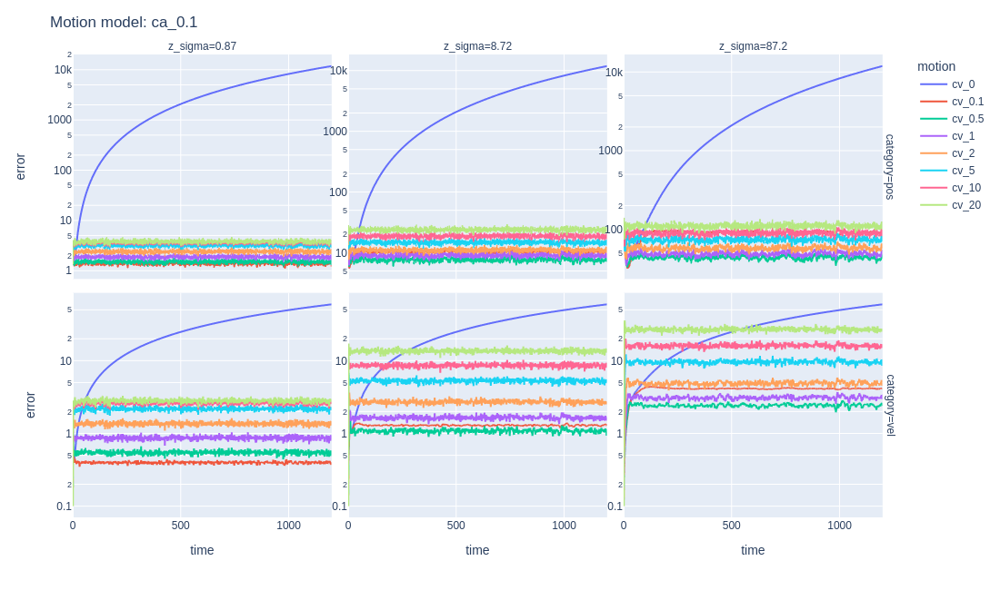

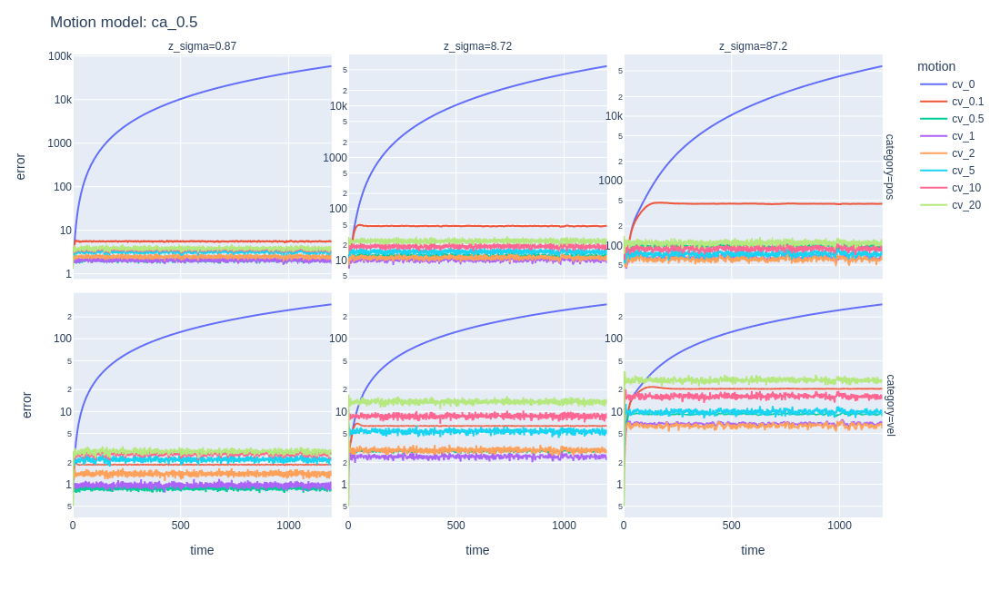

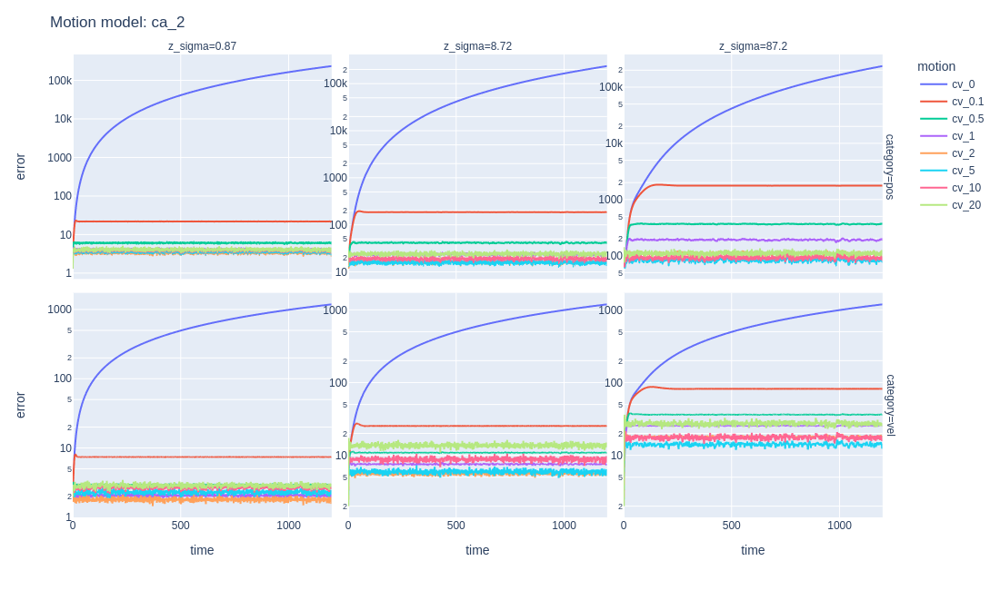

In [18]:
def plot(data):
    fig = ex.line(data, x='time', y='error', color='motion', facet_col='z_sigma', facet_row='category', log_y=True)
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.update_layout(title_text='Motion model: ' + data.target.iloc[0])
    display(as_png(fig, height=650))

plot(data.query('target=="ca_0.1"'))
plot(data.query('target=="ca_0.5"'))
plot(data.query('target=="ca_2"'))

We can see that all test runs, except for `cv_0`, oscillate around a certain level of error. In fact, each case converges on that level after the initial period. We can see that more clearly by plotting the time axis in the `log` scale.

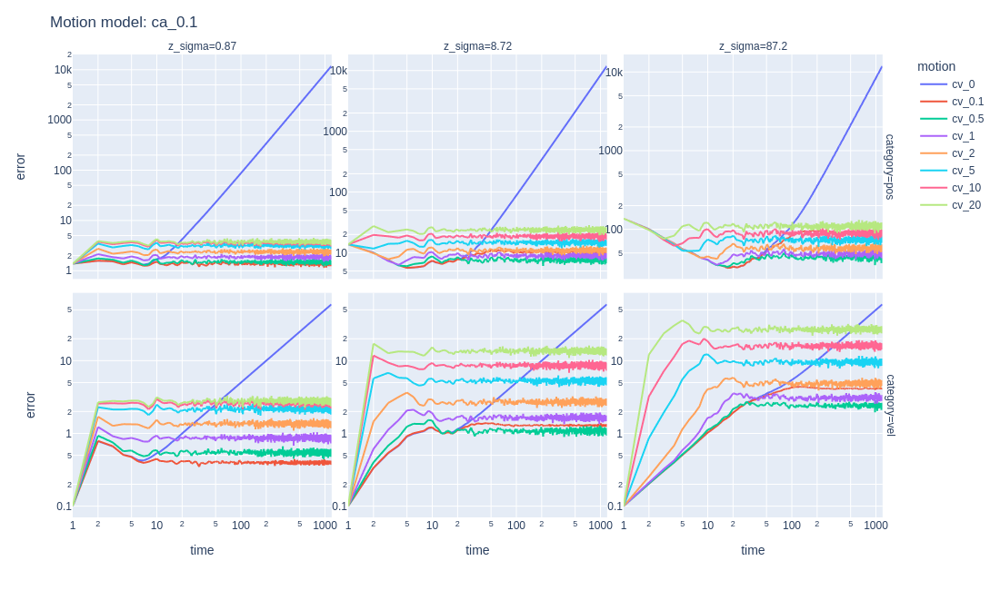

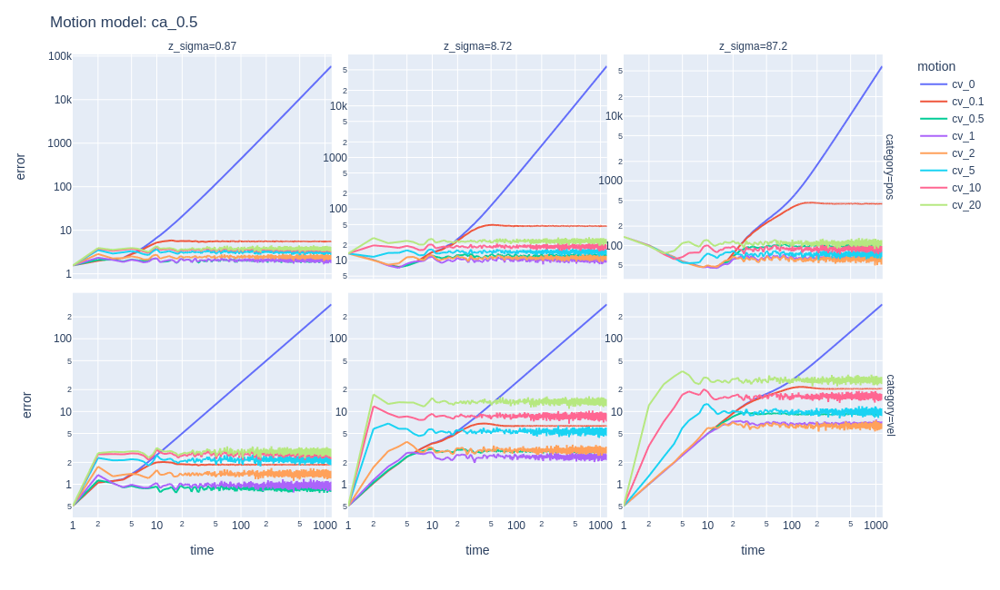

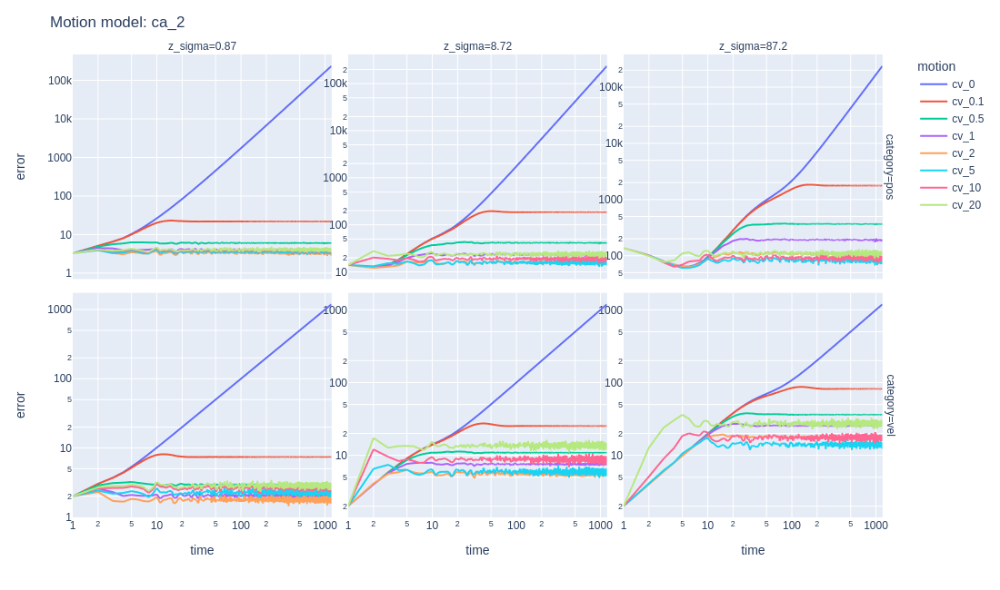

In [19]:
def plot(data):
    fig = ex.line(data, x='time', y='error', color='motion', facet_col='z_sigma', facet_row='category', log_y=True, log_x=True)
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.update_layout(title_text='Motion model: ' + data.target.iloc[0])
    display(as_png(fig, height=650))

plot(data.query('target=="ca_0.1"'))
plot(data.query('target=="ca_0.5"'))
plot(data.query('target=="ca_2"'))

This behavior follows directly from the dynamics of the Kalman Gain and estimated state covariance. We have observed that previously while analyzing the Constant Velocity motion model against the Constant Velocity target, and earlier when taking a closer look at the Kalman Filter itself.

### Excluding the case with zero noise intensity

Non-zero noise intensity allows the Kalman Filter to adapt to changes in velocity - hence, it allows for non-zero acceleration, even if it does not model the impact of that non-zero acceleration in the forward-prediction step. We expect that this setting will underperform a setting which uses a motion model where acceleration is included in the estimated state. Nevertheless, this non-zero noise intensity in the Constant Velocity motion model is enough to allow the Kalman Filter to adapt to the changes in velocity and converge to a "steady" level of state prediction error.

The situation is fundamentally different when noise intensity in the motion model is set to zero. In that case predicted velocity is updated only from the prediction error in the position part of the state, which is insufficient for the velocity part of the state to "catch up with reality". In result, estimated velocity continues to fall behind the true velocity, which we can observe in the plot below.

In [20]:
targets = ConstantAccelerationTarget(.5)
motion  = constant_velocity_models(0)
z_sigma = .87
r       = monte_carlo(targets, motion, z_sigma, n=1200, seeds=[0])[0]

ex.line(y=r.x_hat_df.vx - r.truth_df.vx, title='Estimated velocity minus true velocity', labels=dict(x='time', y='$\hat{v} - v$'))

Moving on, we will not include the Constant Velocity motion model with zero noise intensity in the analysis.

## Analysis

In [21]:
targets = [ConstantAccelerationTarget(.1), ConstantAccelerationTarget(.5), ConstantAccelerationTarget(2)]
motion  = constant_velocity_models(.1 ,.5, 1, 2, 5, 10, 20)
z_sigma = [.87, 8.72, 87.2]

In [22]:
%cache results_2 = monte_carlo(targets, motion, z_sigma, n=1200)

Creating new value for variable 'results_2'


In [23]:
results = results_2

### Verify measurements

In [24]:
x = execute(results[0].copy(n=10000))
x.z_sigma, np.sqrt(x.R), np.std((x.z - x.truth[:,:3]), axis=0)

(0.87, 0.87, array([0.86803687, 0.8576075 , 0.87661558]))

### Error aggregated across random seeds

Now we plot Euclidean-distance error as a function of time, aggregated over simulated runs where only the random seed is different between each run.

In [25]:
def aggregate_errors(group):
    skip = 0
    pos = [np.sqrt(np.power(r.truth[skip:,:3] - r.x_hat[skip:,:3], 2).sum(axis=1)) for r in group]
    vel = [np.sqrt(np.power(r.truth[skip:,3:6] - r.x_hat[skip:,3:6], 2).sum(axis=1)) for r in group]
    df = pd.DataFrame(dict(time=np.arange(pos[0].shape[0]), pos=np.array(pos).T.mean(axis=1), vel=np.array(vel).T.mean(axis=1)))
    return df.melt(['time'], None, 'category', 'error')

# group by everything except the random seed
data = results.group_by(['target', 'motion', 'z_sigma', 'R']).apply_df(aggregate_errors)

As illustrated in the plot below, each configuration of `z_sigma` and `motion` has a different "steady-state" variance and a different time until it reaches that "steady-state" level. The lower the combined measurement and process noise, the longer it takes until the "steady-state" variances is reached, but also the lower that final value is.

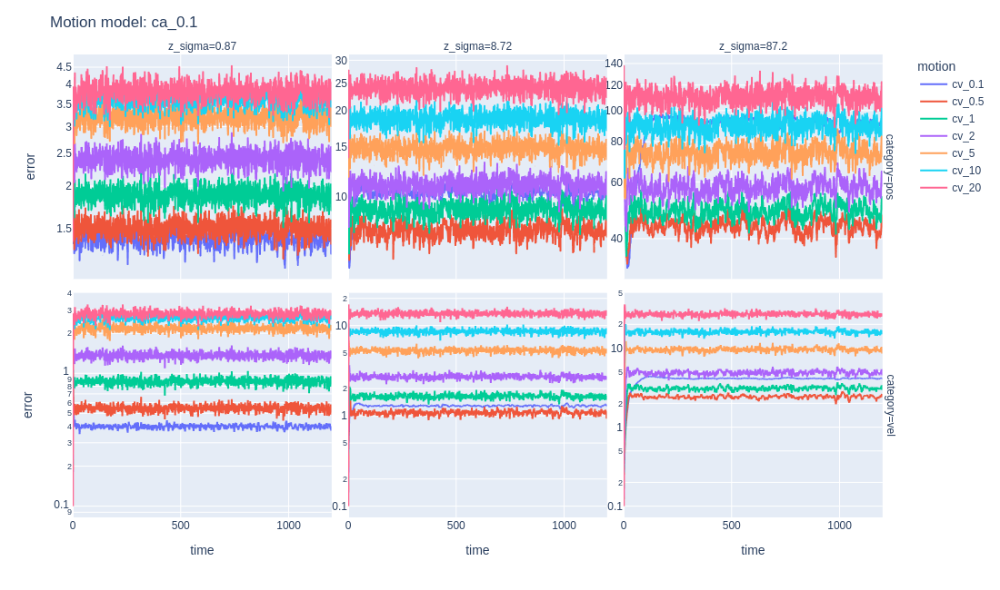

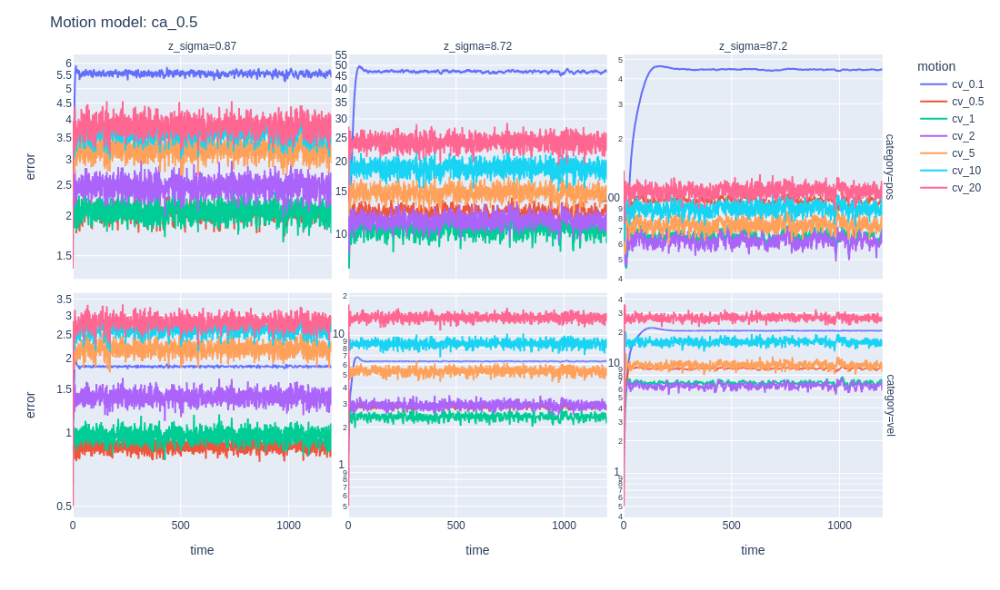

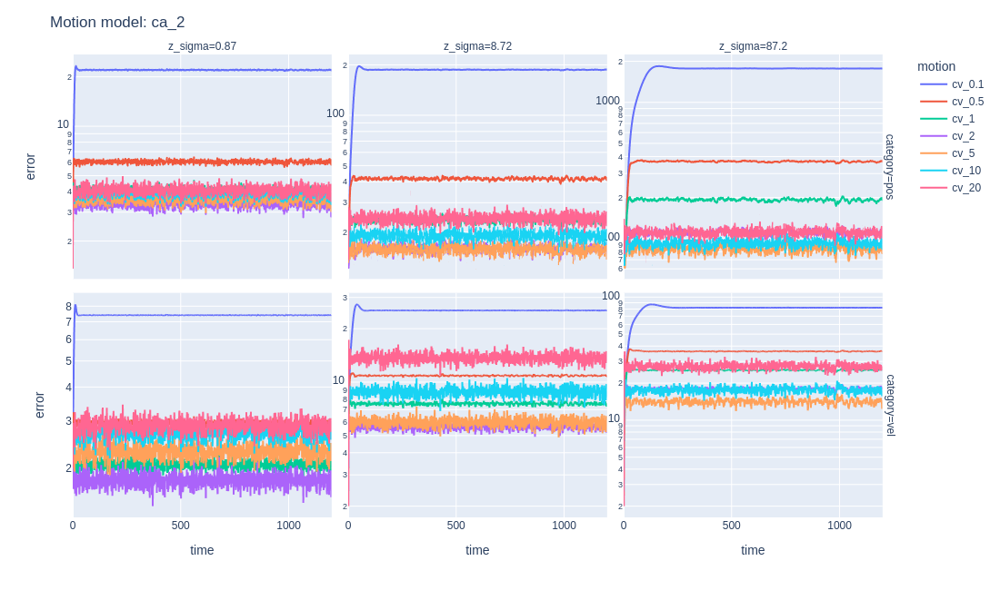

In [26]:
def plot(data):
    fig = ex.line(data, x='time', y='error', color='motion', facet_col='z_sigma', facet_row='category', log_y=True)
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.update_layout(title_text='Motion model: ' + data.target.iloc[0])
    display(as_png(fig, height=650))

plot(data.query('target=="ca_0.1"'))
plot(data.query('target=="ca_0.5"'))
plot(data.query('target=="ca_2"'))

First, let's zoom into the initial period where each instance of the Kalman Filter converges towards its steady-state level. We do that by changing the X axis to the logarithmic scale.

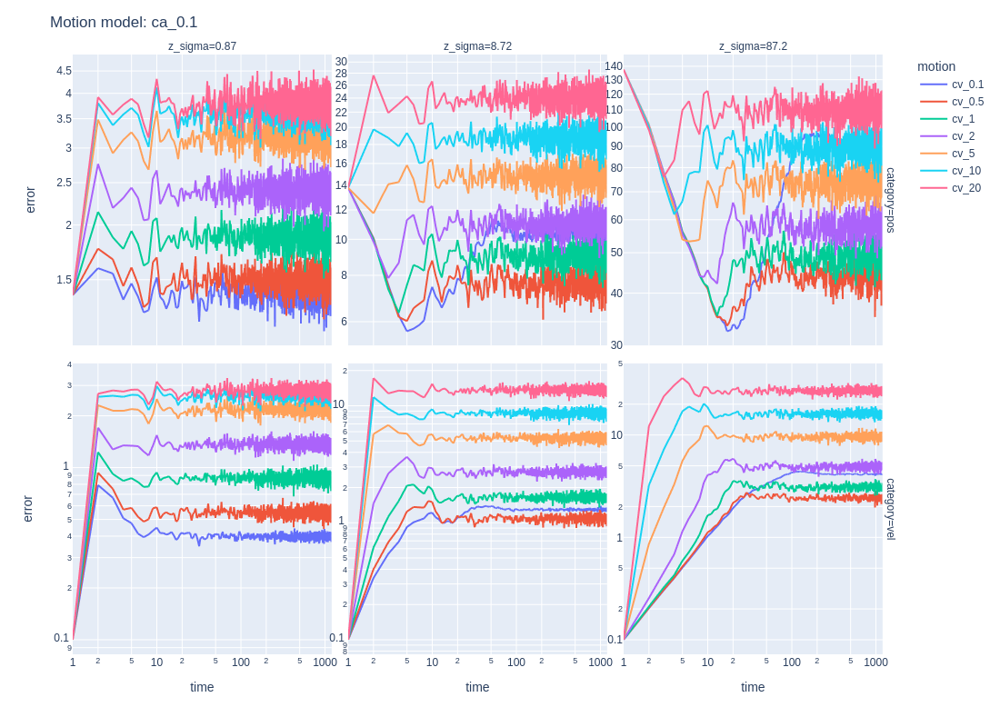

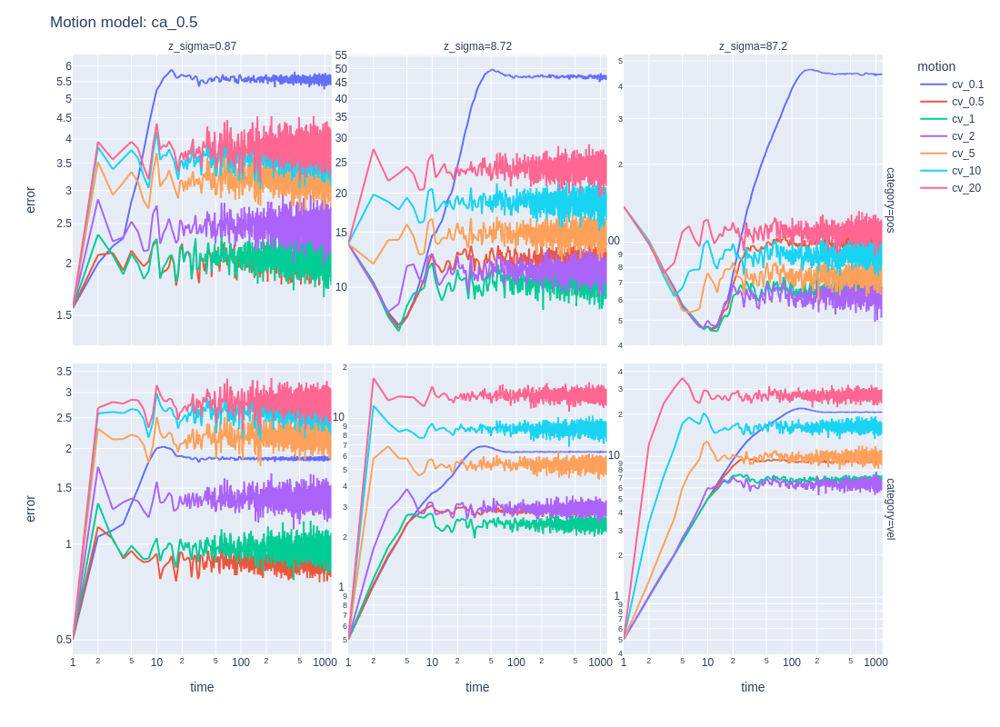

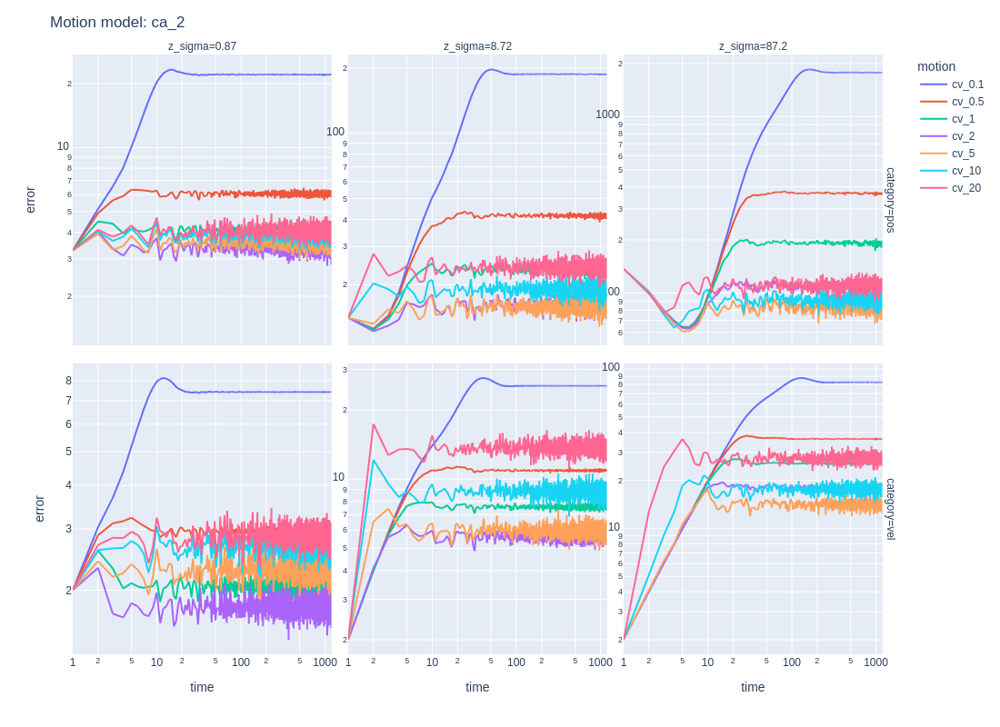

In [27]:
def plot(data):
    fig = ex.line(data, x='time', y='error', color='motion', facet_col='z_sigma', facet_row='category', log_x=True, log_y=True)
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.update_layout(title_text='Motion model: ' + data.target.iloc[0])
    display(as_png(fig, height=800))

plot(data.query('target=="ca_0.1"'))
plot(data.query('target=="ca_0.5"'))
plot(data.query('target=="ca_2"'))

Now, let's zoom into the steady-state part by selecting for `time` larger than 600.

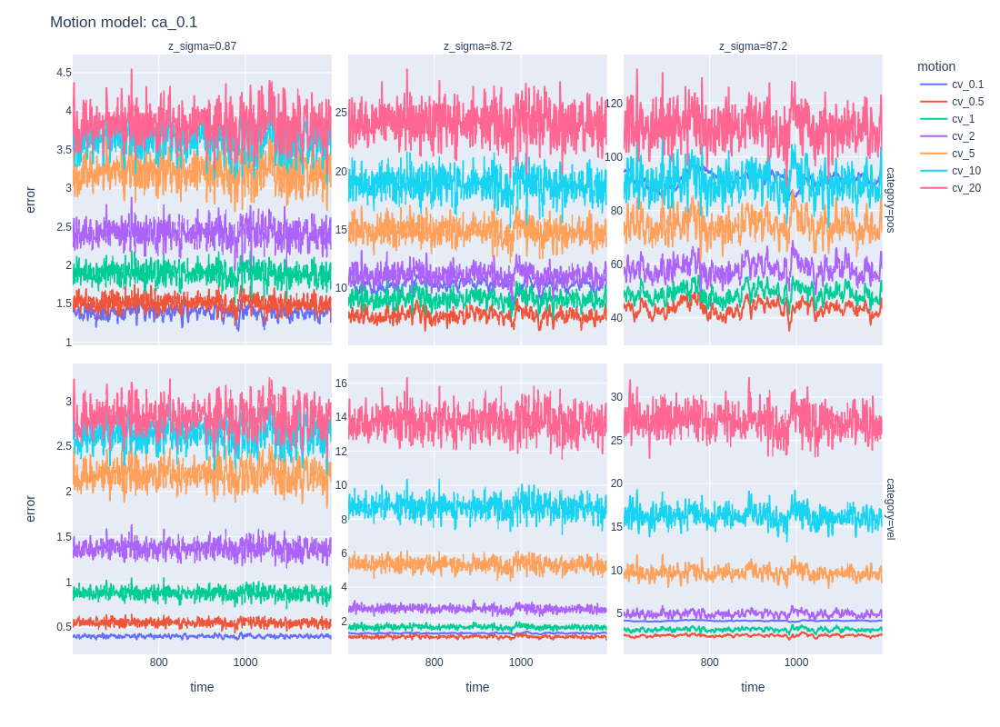

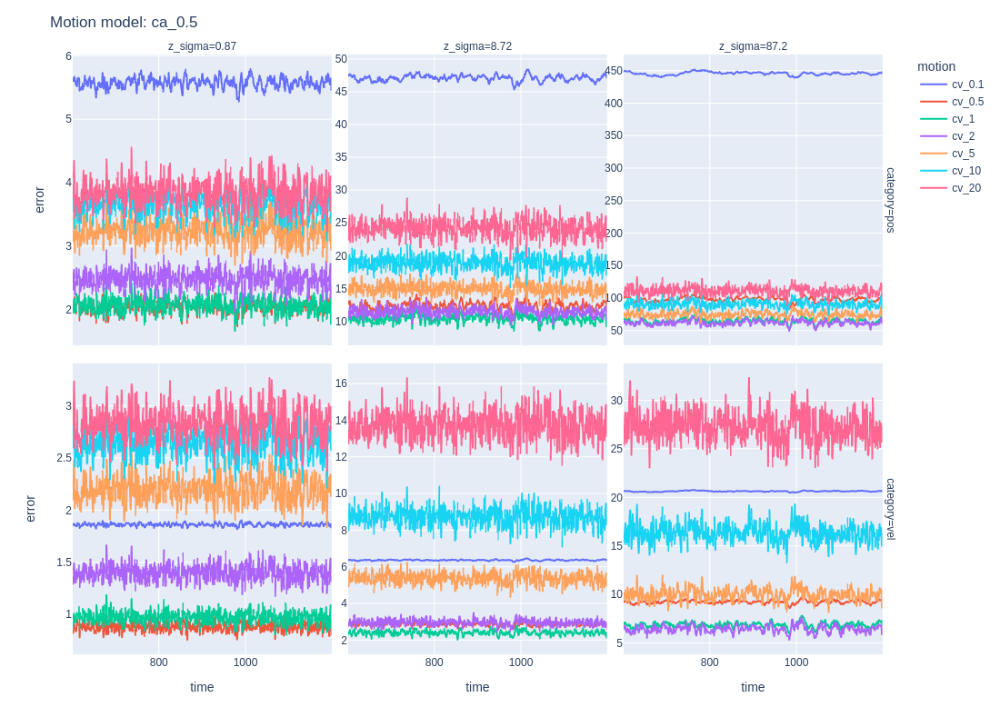

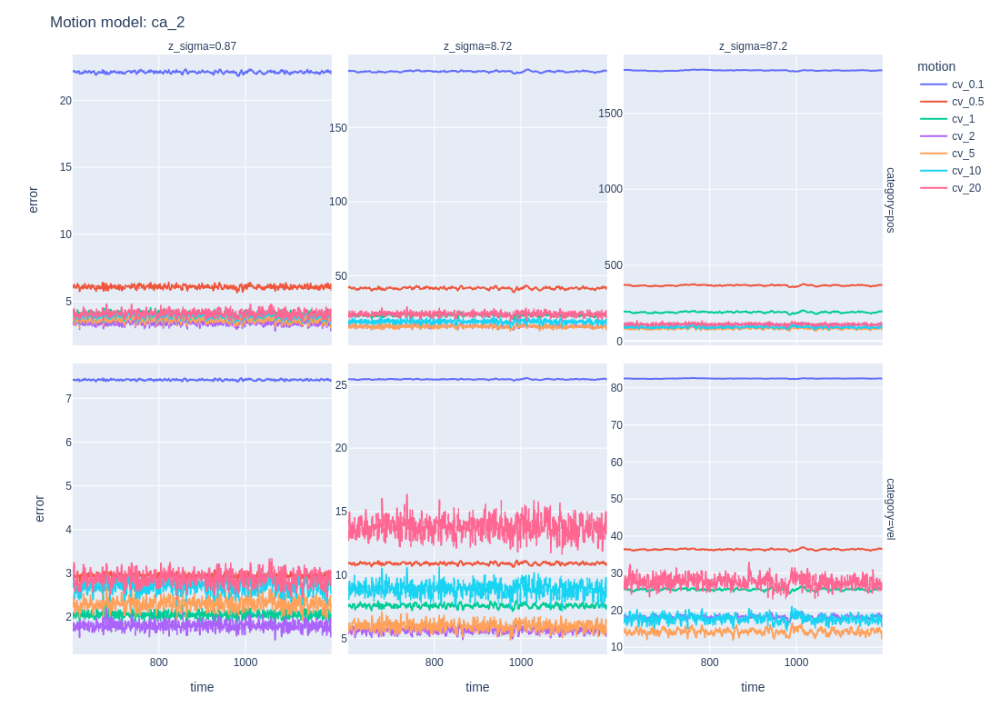

In [28]:
def plot(data):
    fig = ex.line(data.query('time > 600'), x='time', y='error', color='motion', facet_col='z_sigma', facet_row='category')
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.update_layout(title_text='Motion model: ' + data.target.iloc[0])
    display(as_png(fig, height=800))

plot(data.query('target=="ca_0.1"'))
plot(data.query('target=="ca_0.5"'))
plot(data.query('target=="ca_2"'))

Let's also look at histograms of these values for `time > 600`.

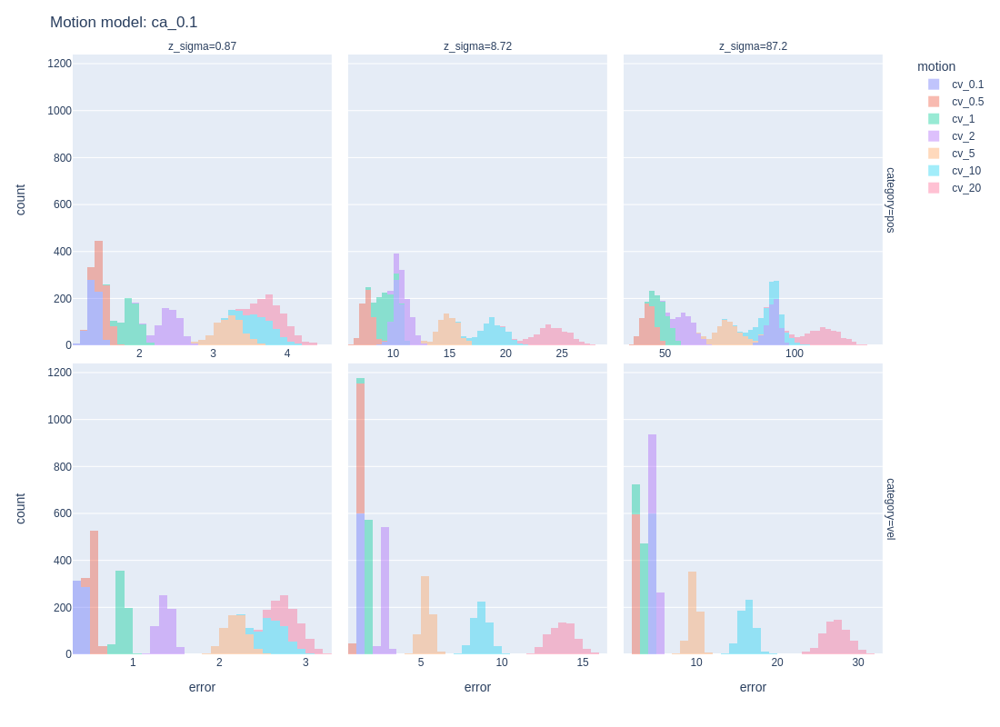

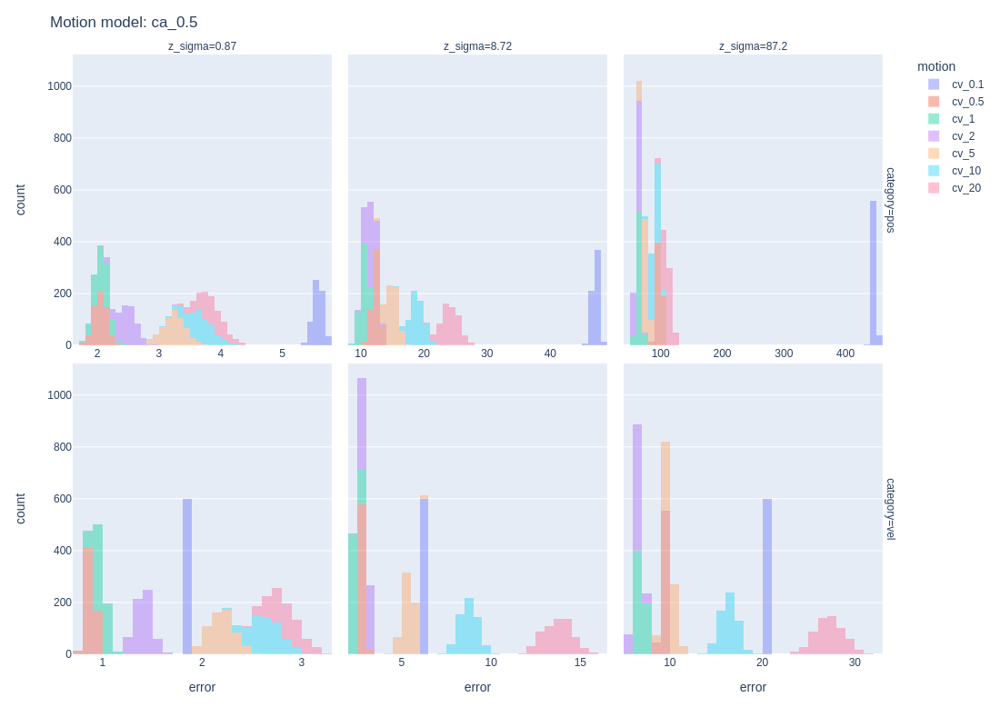

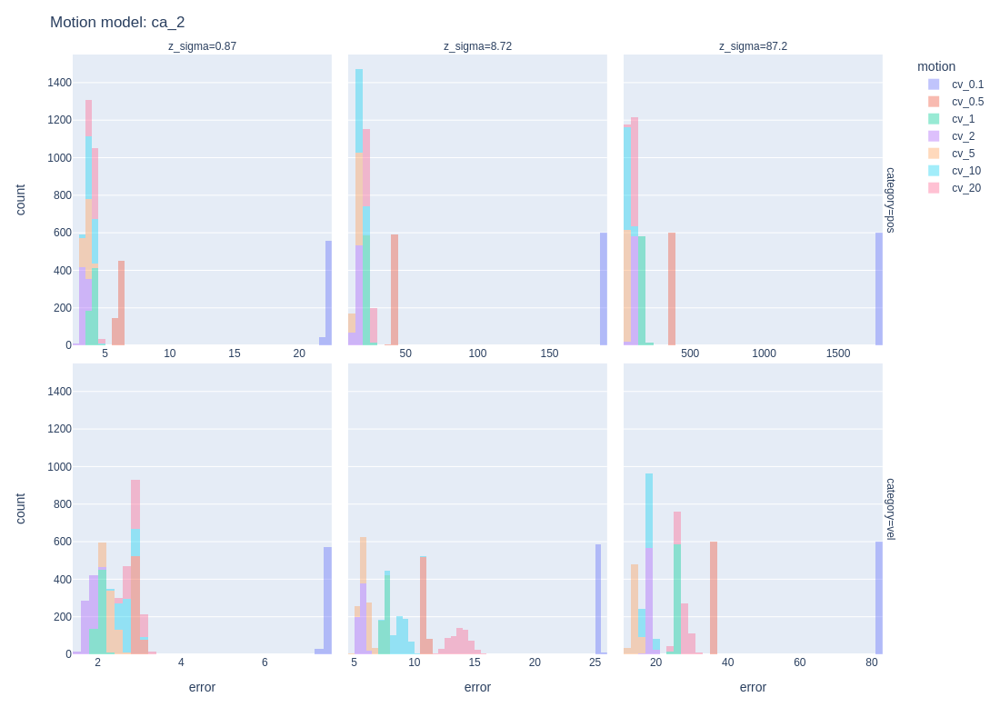

In [29]:
def plot(data):
    fig = ex.histogram(data.query('time > 600'), x='error', color='motion', facet_col='z_sigma', facet_row='category', nbins=50)
    fig.update_xaxes(matches=None, showticklabels=True)
    fig.update_traces(bingroup=None)
    fig.update_traces(opacity=.4)
    fig.update_layout(title_text='Motion model: ' + data.target.iloc[0])
    display(as_png(fig, height=800))

plot(data.query('target=="ca_0.1"'))
plot(data.query('target=="ca_0.5"'))
plot(data.query('target=="ca_2"'))

Finally, let's plot the steady-state mean error as a function of `z_sigma` and the motion model.

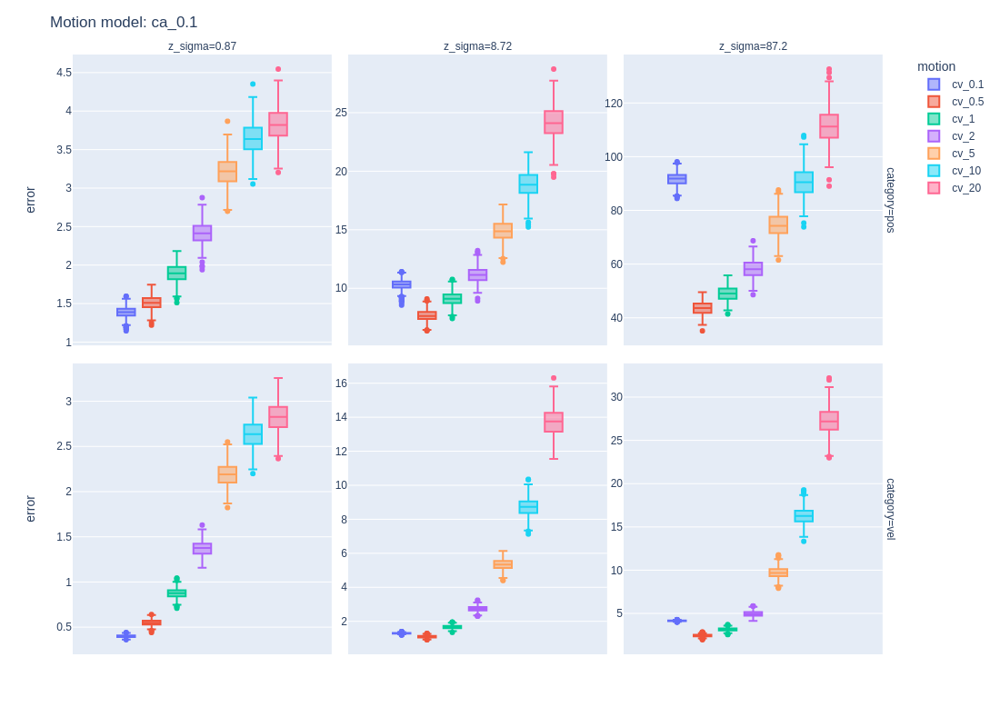

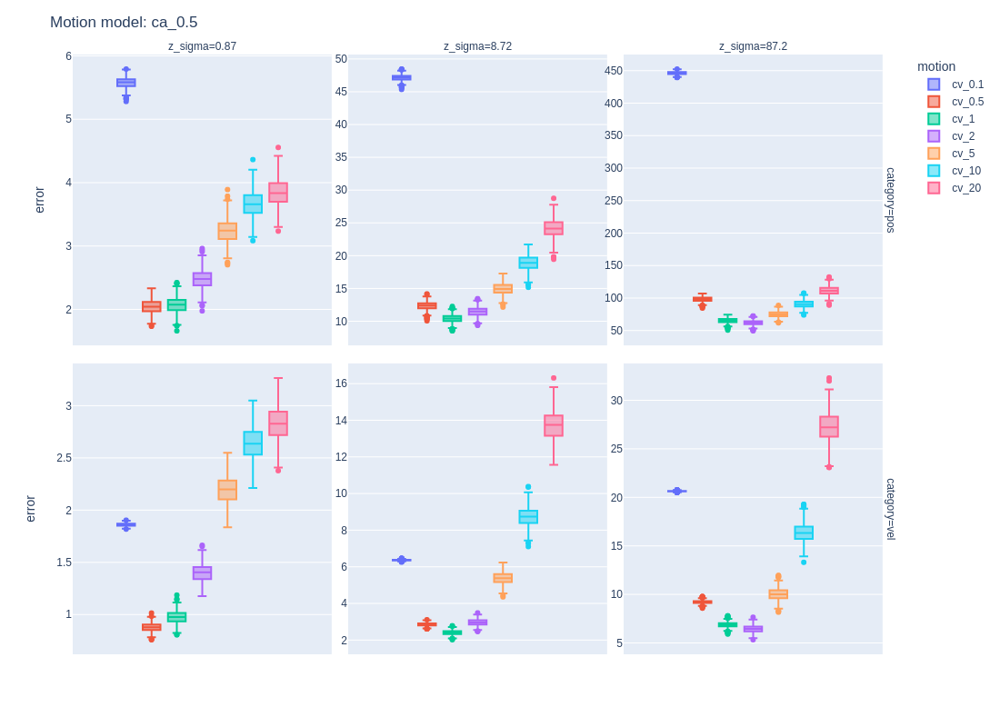

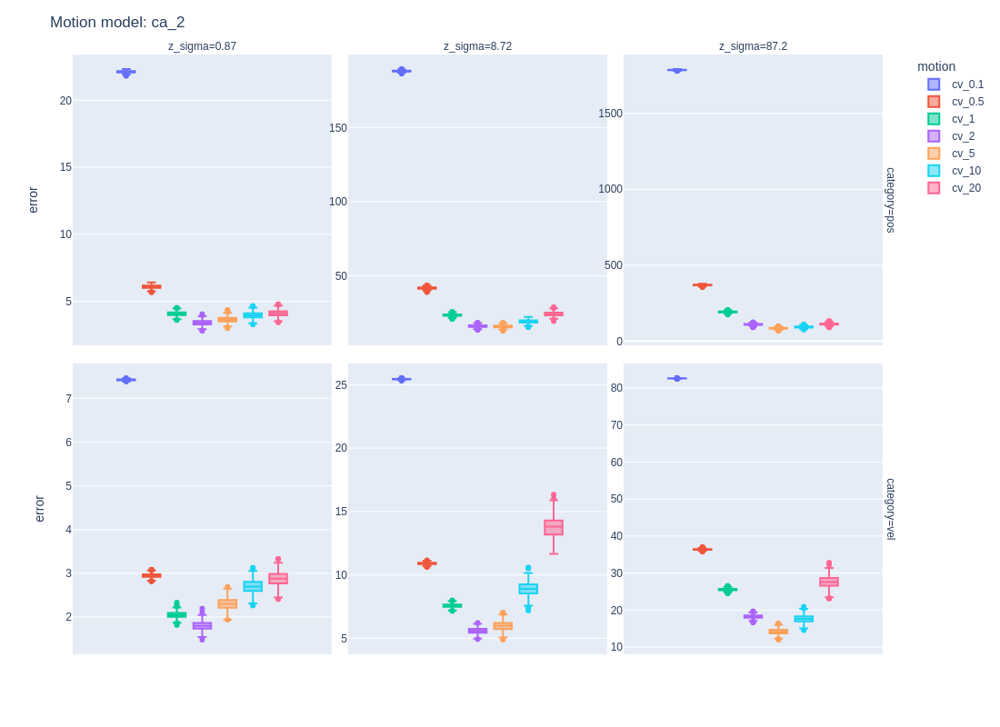

In [30]:
def plot(data):
    fig = ex.box(data.query('time > 600'), y='error', color='motion', facet_col='z_sigma', facet_row='category')
    fig.update_xaxes(matches=None, showticklabels=True)
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.update_layout(title_text='Motion model: ' + data.target.iloc[0])
    display(as_png(fig, height=800))

plot(data.query('target=="ca_0.1"'))
plot(data.query('target=="ca_0.5"'))
plot(data.query('target=="ca_2"'))

**TODO**: there is clearly value of $Q$ which minimizes the overall estimation error. That value changes given the measurement noise `z_sigma` and the value of acceleration.

## Error in each dimension

Let's check what does the error distribution look like in each dimension separately. We expect to see normally distributed error with zero mean.

#### Position

In [31]:
def position_residuals(group):
    parts = []
    for r in group:
        # calculate residuals of position but skip the first 100 points
        err = r.truth[:,:3] - r.x_hat[:,:3]
        parts.append(to_df(err[600:,:], columns=['x','y','z']))
    return pd.concat(parts).melt(var_name='dim', value_name='residual')

data = results.group_by(['target', 'motion', 'z_sigma', 'R']).apply_df(position_residuals)

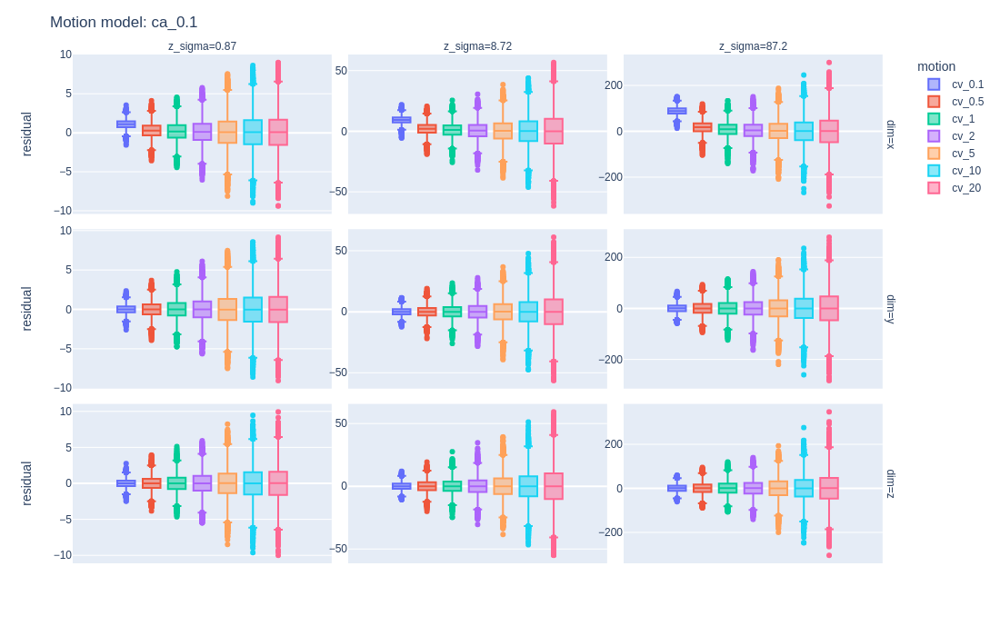

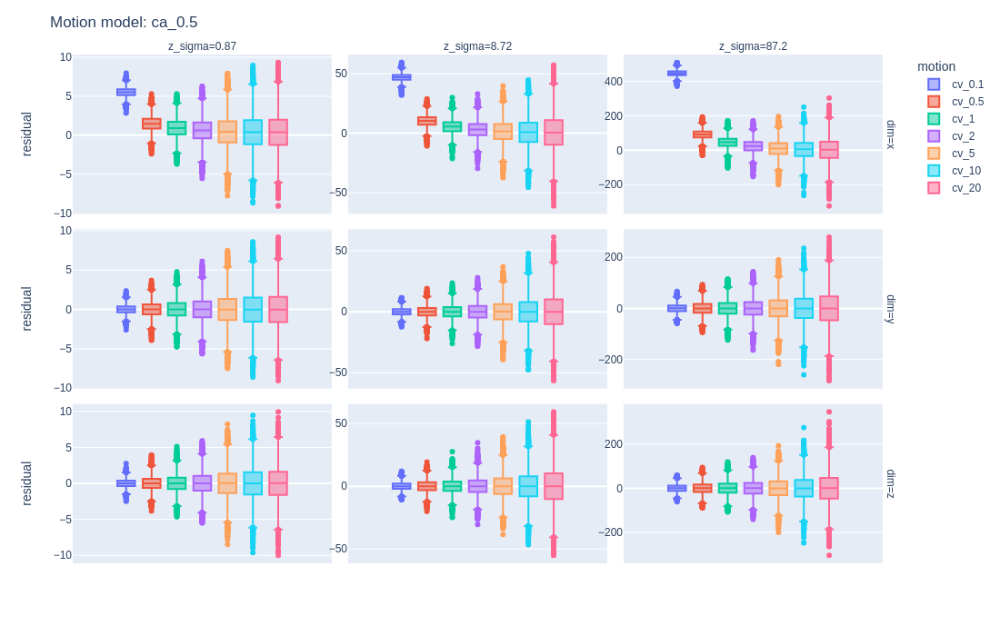

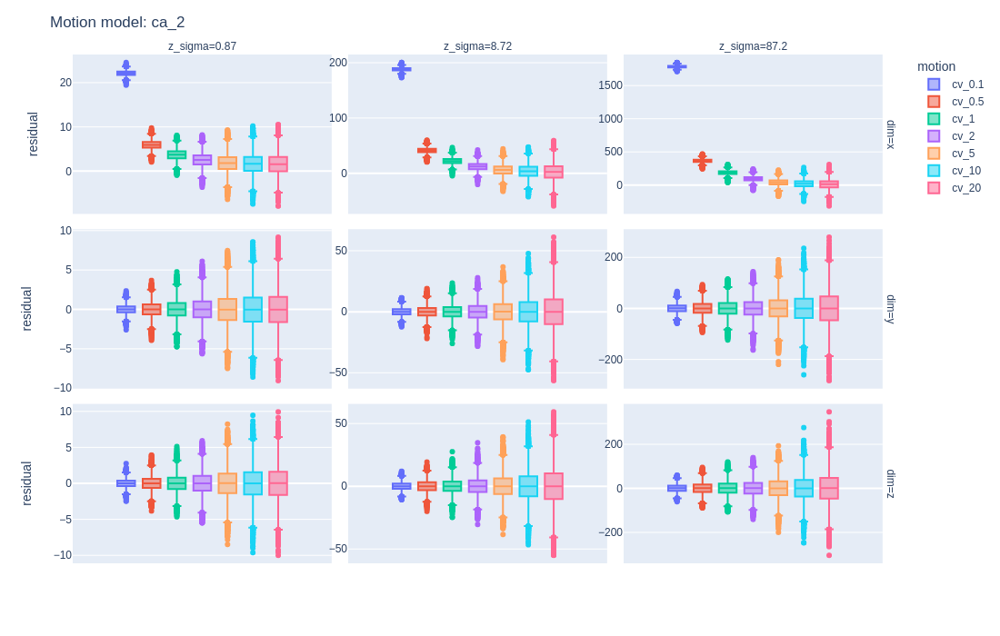

In [32]:
def plot(data):
    fig = ex.box(data, y='residual', color='motion', facet_col='z_sigma', facet_row='dim')
    fig.update_traces(quartilemethod="exclusive")
    fig.update_xaxes(type='category')
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.update_layout(height=700, title_text='Motion model: ' + data.target.iloc[0])
    display(as_png(fig))

plot(data.query('target=="ca_0.1"'))
plot(data.query('target=="ca_0.5"'))
plot(data.query('target=="ca_2"'))

#### Velocity

Similarily, in case of velocity we expect normally distributed estimation error with zero mean. Standard deviation will be lower than in the case of position estimation errror.

In [33]:
def velocity_residuals(group):
    parts = []
    for r in group:
        # calculate residuals of position but skip the first 100 points
        err = r.truth[:,3:6] - r.x_hat[:,3:6]
        parts.append(to_df(err[600:,:], columns=['x','y','z']))
    return pd.concat(parts).melt(var_name='dim', value_name='residual')

data = results.group_by(['target', 'motion', 'z_sigma', 'R']).apply_df(velocity_residuals)

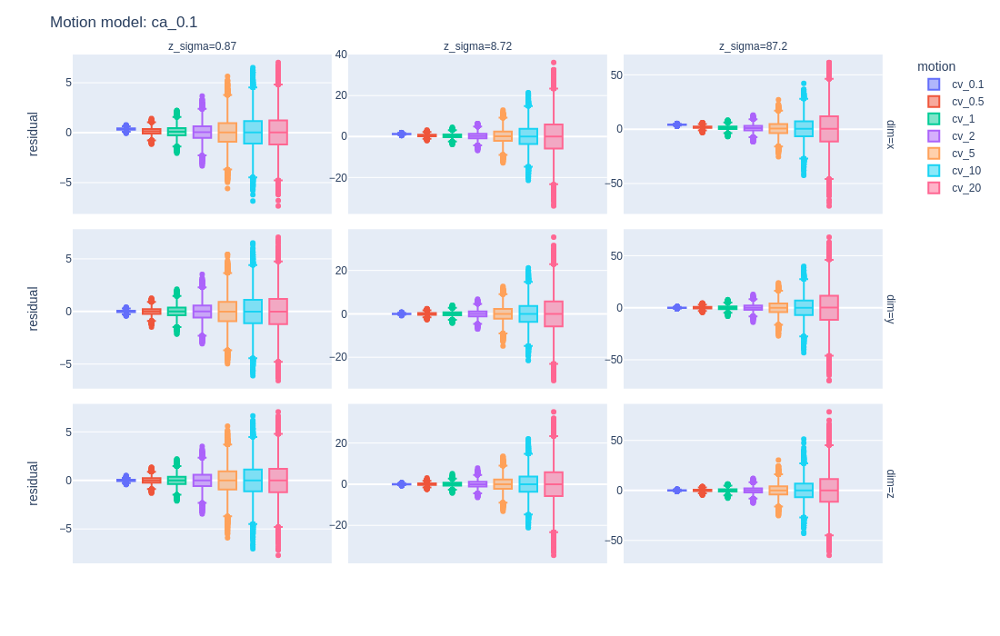

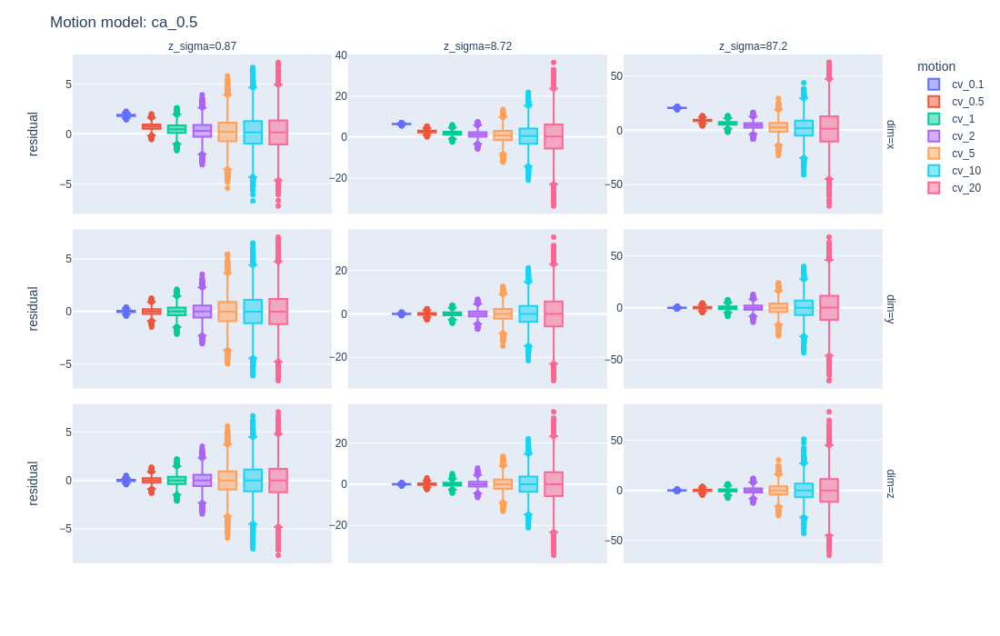

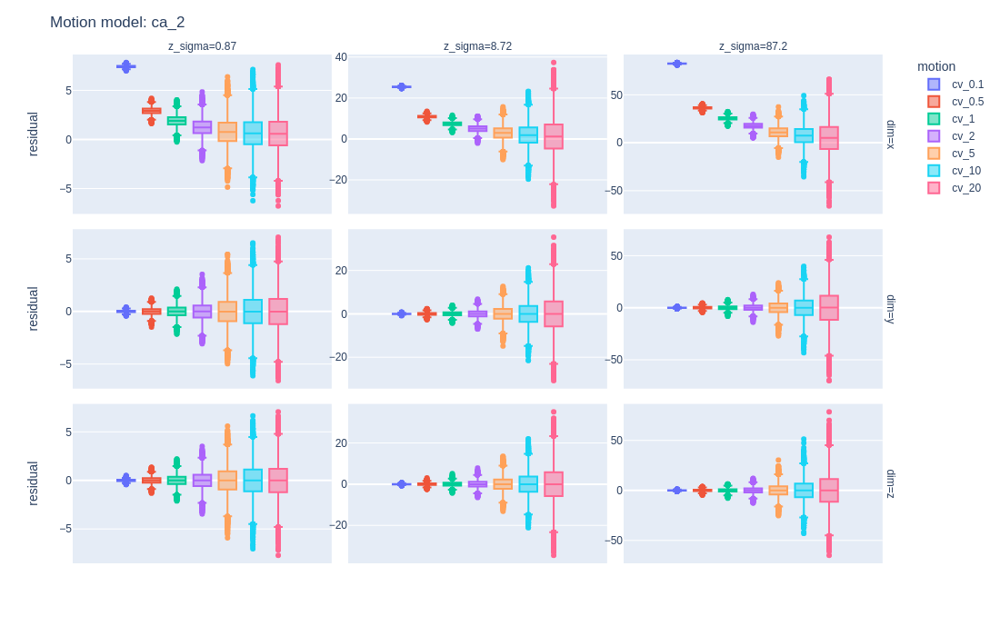

In [34]:
def plot(data):
    fig = ex.box(data, y='residual', color='motion', facet_col='z_sigma', facet_row='dim')
    fig.update_traces(quartilemethod="exclusive")
    fig.update_xaxes(type='category')
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.update_layout(height=700, title_text='Motion model: ' + data.target.iloc[0])
    display(as_png(fig))

plot(data.query('target=="ca_0.1"'))
plot(data.query('target=="ca_0.5"'))
plot(data.query('target=="ca_2"'))

## Error convergence

The bias in state estimate converges to a level which can be predicted given measurement noise, process noise and sampling rate. First, we need to obtain the limit of Kalman gain values. We covered that previously in "Kalman Gain convergence".

In [35]:
Kx, Kv = kalman_gain_pv(8.72, 1).squeeze()
Kx, Kv

(0.5608605313021655, 0.22441040709818208)

Next, we derive the value of the biases of position and velocity estimates in a single dimension, given the acceleration in that dimension.

$$
d_x = \frac{at}{K_v}
$$
$$
d_v = \frac{at}{K_v}(K_x + K_v) - \frac{a}{2}
$$

In [36]:
def bias(Kx, Kv, a, t):
    return a*t/Kv, a*t/(Kx+Kv) - a/2

In [37]:
targets = [ConstantAccelerationTarget(.1), ConstantAccelerationTarget(.5), ConstantAccelerationTarget(2)]
motion  = constant_velocity_models(.1 ,.5, 1, 2, 5, 10, 20)
z_sigma = [.87, 8.72, 87.2]

In [38]:
%cache results_3 = monte_carlo(targets, motion, z_sigma, n=5000)

Creating new value for variable 'results_3'


In [39]:
results = results_3

In [40]:
def position_bias(group):
    skip = 1000
    parts = [r.truth[skip:,:3] - r.x_hat[skip:,:3] for r in group]
    return to_df(np.median(np.concatenate(parts), axis=0).reshape((1, 3)), columns=['x', 'y', 'z'])

data = results.group_by(['target', 'motion', 'z_sigma', 'R']).apply_df(position_bias)

In [41]:
def compare_x_bias(x):
    R, actual_bias = x['R'].iloc[0], x['x'].iloc[0]
    acceleration, noise = float(str(x['target'].iloc[0])[3:]), float(str(x['motion'].iloc[0])[3:])
    
    Kx, Kv = kalman_gain_pv(R, noise*noise).squeeze()
    dx, dv = bias(Kx, Kv, acceleration, 1)
    
    return pd.DataFrame(dict(a=acceleration,
                             noise=noise,
                             actual=actual_bias,
                             expected=dx,
                             error_abs=actual_bias - dx,
                             error_rel=(actual_bias - dx)/dx),
                        index=[0])

pos_biases = data.groupby(['z_sigma', 'R', 'target', 'motion']).apply(compare_x_bias)

In [42]:
with pd.option_context("display.max_rows", 100):
    display(pos_biases.sort_values(['z_sigma', 'R', 'target', 'noise']))

a  noise       actual     expected  \
z_sigma R         target motion                                           
0.87    0.7569    ca_0.1 cv_0.1 0  0.1    0.1     1.106294     1.105689   
                         cv_0.5 0  0.1    0.5     0.297555     0.297389   
                         cv_1   0  0.1    1.0     0.185400     0.185596   
                         cv_2   0  0.1    2.0     0.128405     0.126733   
                         cv_5   0  0.1    5.0     0.092970     0.091921   
                         cv_10  0  0.1   10.0     0.082673     0.082792   
                         cv_20  0  0.1   20.0     0.079733     0.079913   
                  ca_0.5 cv_0.1 0  0.5    0.1     5.529049     5.528444   
                         cv_0.5 0  0.5    0.5     1.487113     1.486947   
                         cv_1   0  0.5    1.0     0.927785     0.927982   
                         cv_2   0  0.5    2.0     0.635338     0.633666   
                         cv_5   0  0.5    5.0     0.460655     0.459605   
                         cv_10  0  0.5   10.0     0.413840     0.413959   
                         cv_20  0  0.5   20.0     0.399386     0.399566   
                  ca_2   cv_0.1 0  2.0    0.1    22.114380    22.113775   
                         cv_0.5 0  2.0    0.5     5.947953     5.947786   
                         cv_1   0  2.0    1.0     3.711730     3.711926   
                         cv_2   0  2.0    2.0     2.536337     2.534666   
                         cv_5   0  2.0    5.0     1.839470     1.838421   
                         cv_10  0  2.0   10.0     1.655717     1.655835   
                         cv_20  0  2.0   20.0     1.598084     1.598265   
8.72    76.0384   ca_0.1 cv_0.1 0  0.1    0.1     9.409920     9.405946   
                         cv_0.5 0  0.1    0.5     2.076754     2.065769   
                         cv_1   0  0.1    1.0     1.113761     1.107926   
                         cv_2   0  0.1    2.0     0.632314     0.611722   
                         cv_5   0  0.1    5.0     0.297810     0.297890   
                         cv_10  0  0.1   10.0     0.181806     0.185862   
                         cv_20  0  0.1   20.0     0.143692     0.126871   
                  ca_0.5 cv_0.1 0  0.5    0.1    47.033704    47.029730   
                         cv_0.5 0  0.5    0.5    10.339829    10.328844   
                         cv_1   0  0.5    1.0     5.545464     5.539629   
                         cv_2   0  0.5    2.0     3.079203     3.058612   
                         cv_5   0  0.5    5.0     1.489369     1.489449   
                         cv_10  0  0.5   10.0     0.925253     0.929309   
                         cv_20  0  0.5   20.0     0.651175     0.634353   
                  ca_2   cv_0.1 0  2.0    0.1   188.122895   188.118922   
                         cv_0.5 0  2.0    0.5    41.326363    41.315378   
                         cv_1   0  2.0    1.0    22.164351    22.158515   
                         cv_2   0  2.0    2.0    12.255038    12.234446   
                         cv_5   0  2.0    5.0     5.957717     5.957796   
                         cv_10  0  2.0   10.0     3.713179     3.717235   
                         cv_20  0  2.0   20.0     2.554234     2.537413   
87.20   7603.8400 ca_0.1 cv_0.1 0  0.1    0.1    89.367879    89.313262   
                         cv_0.5 0  0.1    0.5    18.484964    18.399262   
                         cv_1   0  0.1    1.0     9.445681     9.405946   
                         cv_2   0  0.1    2.0     4.811840     4.852821   
                         cv_5   0  0.1    5.0     2.175619     2.065769   
                         cv_10  0  0.1   10.0     1.166277     1.107926   
                         cv_20  0  0.1   20.0     0.817639     0.611722   
                  ca_0.5 cv_0.1 0  0.5    0.1   446.620927   446.566310   
                         cv_0.5 0  0.5    0.5    92.082011    91.996308   
                         cv_1   0  0.5    1.0    47.069466    

### RMSE

Root mean squared error (RMSE) calculates the L2 norm of the difference between the estimated and the true position and velocity.

In [43]:
def rmse(group):
    skip = 600
    dims = min(group[0].truth.shape[1], group[0].x_hat.shape[1])
    errs = []
    for r in group:
        err = r.truth[skip:,:dims] - r.x_hat[skip:,:dims]
        pos = np.sqrt(np.power(err[:,:3], 2).sum(axis=1).mean(axis=0))
        vel = np.sqrt(np.power(err[:,3:6], 2).sum(axis=1).mean(axis=0))
        errs.append((pos, vel))
    return to_df(errs, columns=['pos', 'vel']).melt(var_name='category', value_name='rmse')

data = results.group_by(['target', 'motion', 'z_sigma', 'R']).apply_df(rmse)

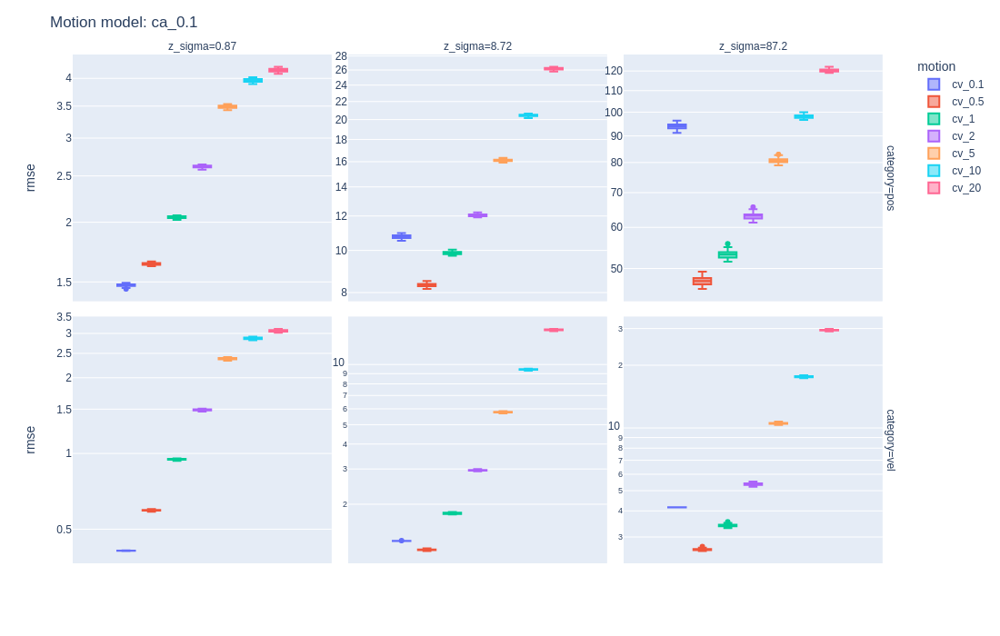

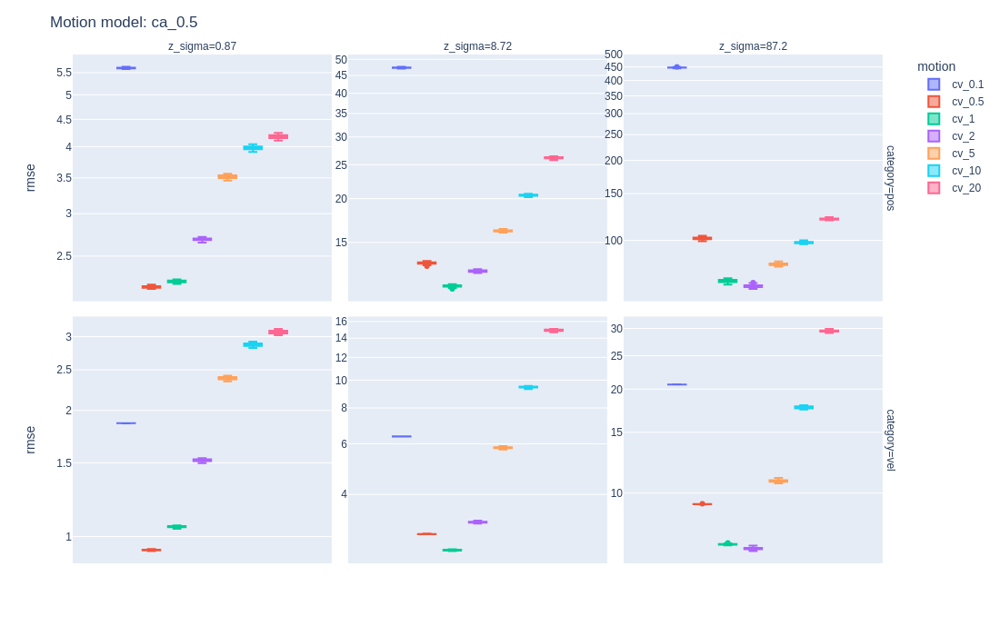

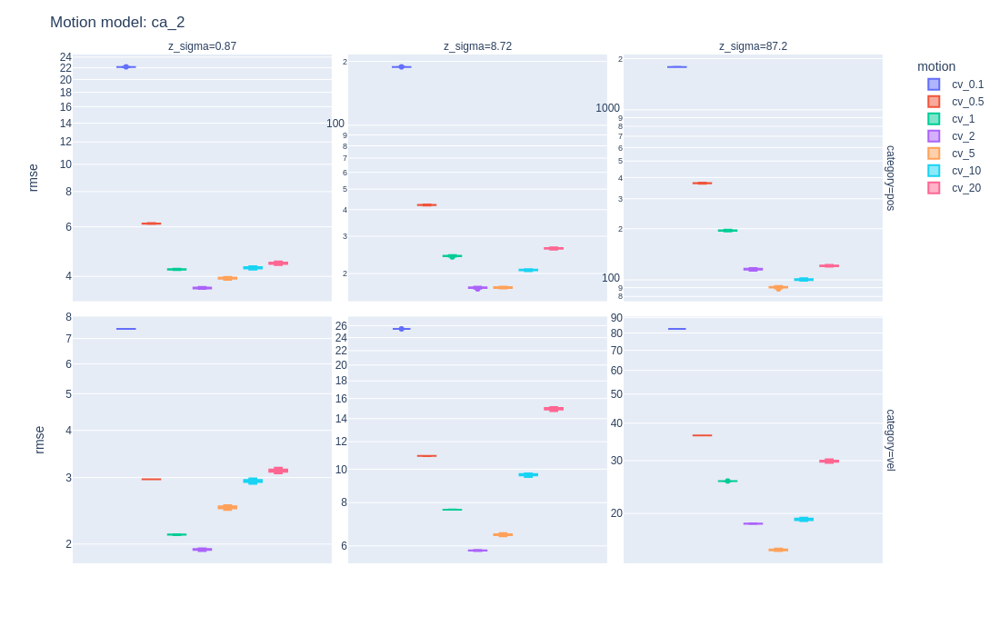

In [44]:
def plot(data):
    fig=ex.box(data, y='rmse', color='motion', facet_col='z_sigma', facet_row='category', log_y=True)
    fig.update_xaxes(type='category')
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.update_layout(height=700, title_text='Motion model: ' + data.target.iloc[0])
    display(as_png(fig))

plot(data.query('target=="ca_0.1"'))
plot(data.query('target=="ca_0.5"'))
plot(data.query('target=="ca_2"'))

In [45]:
data

,category,rmse,target,motion,z_sigma,R
0,pos,1.463397,ca_0.1,cv_0.1,0.87,0.7569
1,pos,1.467097,ca_0.1,cv_0.1,0.87,0.7569
2,pos,1.456487,ca_0.1,cv_0.1,0.87,0.7569
3,pos,1.483444,ca_0.1,cv_0.1,0.87,0.7569
4,pos,1.461193,ca_0.1,cv_0.1,0.87,0.7569
...,...,...,...,...,...,...
6295,vel,29.757191,ca_2,cv_20,87.20,7603.8400
6296,vel,29.996589,ca_2,cv_20,87.20,7603.8400
6297,vel,30.278131,ca_2,cv_20,87.20,7603.8400
6298,vel,30.243194,ca_2,cv_20,87.20,7603.8400


In [46]:
def average_error(df):
    return pd.DataFrame(dict(error=np.mean(df['rmse'])), index=[0])
    
data.query('z_sigma == 87.2 and target=="ca_0.5" and category=="pos"').groupby(['motion']).apply(average_error)

,,error
motion,,
cv_0.1,0,447.384750
cv_0.5,0,101.728460
cv_1,0,70.308349
cv_10,0,98.189584
cv_2,0,67.388697
cv_20,0,120.412311
cv_5,0,81.269047


## Variance of lag

In [122]:
def converge_variances_numerically(Kx, Kv, R=1, n=100, t=1):
    Vx, Vv, Cov = Kx**2 * R, Kv**2 * R, Kx*Kv*R
    
    for _ in range(n):
        nVx = (1-Kx)**2 * (Vx + t**2 * Vv + 2*t*Cov) + Kx**2 * R
        
        nVv = (1-t*Kv)**2 * Vv + \
              Kv**2 * Vx \
              - 2*(1-t*Kv)*Kv*Cov + \
              Kv**2 * R
        
        Cov = Cov*(1-Kx)*(1-2*Kv*t) + \
              t*(1-Kx)*(1-Kv*t)*Vv \
              - (1-Kx)*Kv*Vx + \
              Kx*Kv*R
                
        Vx = nVx
        Vv = nVv
    return Vx, Vv, Cov

def predict_lag_variance(Kx, Kv, R):
    Vx, Vv, Cov = converge_variances_numerically(Kx, Kv, R)
    return Vx+Vv+2*Cov, Vv

In [124]:
def lag_variance(group):
    skip = 600
    pos_a = np.array([r.x_hat[skip:,0] for r in group]).var(axis=0).mean()
    vel_a = np.array([r.x_hat[skip:,3] for r in group]).var(axis=0).mean()
    
    Q = group[0].motion_model.noise_intensity ** 2 # base variance (noise intens.) for the constant velocity model
    Kx, Kv = kalman_gain_pv(group[0].R, Q).squeeze()

    pos_p, vel_p = predict_lag_variance(Kx, Kv, group[0].R)
   
    return pd.DataFrame(dict(pos_p=pos_p, pos_a=pos_a, vel_p=vel_p, vel_a=vel_a, Kx=Kx, Kv=Kv, index=[0]))

data = results.group_by(['target', 'motion', 'z_sigma', 'R']).apply_df(lag_variance)

In [126]:
with pd.option_context("display.max_rows", 100):
    display(data.groupby(['z_sigma', 'R', 'motion', 'target'])\
            .apply(lambda x: x[['pos_p', 'pos_a', 'vel_p', 'vel_a', 'Kx', 'Kv']]))

pos_p        pos_a       vel_p  \
z_sigma R         motion target                                            
0.87    0.7569    cv_0.1 ca_0.1 0      0.319109     0.313334    0.010328   
                         ca_0.5 21     0.319109     0.313334    0.010328   
                         ca_2   42     0.319109     0.313334    0.010328   
                  cv_0.5 ca_0.1 3      0.861898     0.845176    0.110825   
                         ca_0.5 24     0.861898     0.845176    0.110825   
                         ca_2   45     0.861898     0.845176    0.110825   
                  cv_1   ca_0.1 6      1.386000     1.359578    0.296334   
                         ca_0.5 27     1.386000     1.359578    0.296334   
                         ca_2   48     1.386000     1.359578    0.296334   
                  cv_10  ca_0.1 15     5.232105     5.122055    2.742627   
                         ca_0.5 36     5.232105     5.122055    2.742627   
                         ca_2   57     5.232105     5.122055    2.742627   
                  cv_2   ca_0.1 9      2.272057     2.228834    0.738563   
                         ca_0.5 30     2.272057     2.228834    0.738563   
                         ca_2   51     2.272057     2.228834    0.738563   
                  cv_20  ca_0.1 18     5.773365     5.649724    3.150802   
                         ca_0.5 39     5.773365     5.649724    3.150802   
                         ca_2   60     5.773365     5.649724    3.150802   
                  cv_5   ca_0.1 12     4.056861     3.975033    1.888820   
                         ca_0.5 33     4.056861     3.975033    1.888820   
                         ca_2   54     4.056861     3.975033    1.888820   
8.72    76.0384   cv_0.1 ca_0.1 1      9.083754     8.975350    0.032984   
                         ca_0.5 22     9.083754     8.975350    0.032984   
                         ca_2   43     9.083754     8.975350    0.032984   
                  cv_0.5 ca_0.1 4     21.614652    21.248418    0.367351   
                         ca_0.5 25    21.614652    21.248418    0.367351   
                         ca_2   46    21.614652    21.248418    0.367351   
                  cv_1   ca_0.1 7     32.015259    31.435873    1.033983   
                         ca_0.5 28    32.015259    31.435873    1.033983   
                         ca_2   49    32.015259    31.435873    1.033983   
                  cv_10  ca_0.1 16   139.012702   136.362397   29.675461   
                         ca_0.5 37   139.012702   136.362397   29.675461   
                         ca_2   58   139.012702   136.362397   29.675461   
                  cv_2   ca_0.1 10    48.301460    47.394320    2.895742   
                         ca_0.5 31    48.301460    47.394320    2.895742   
                         ca_2   52    48.301460    47.394320    2.895742   
                  cv_20  ca_0.1 19   227.880508   223.545651   73.986782   
                         ca_0.5 40   227.880508   223.545651   73.986782   
                         ca_2   61   227.880508   223.545651   73.986782   
                  cv_5   ca_0.1 13    86.454674    84.777403   11.096605   
                         ca_0.5 34    86.454674    84.777403   11.096605   
                         ca_2   55    86.454674    84.777403   11.096605   
87.20   7603.8400 cv_0.1 ca_0.1 2    275.193097   275.645295    0.102018   
                         ca_0.5 23   275.193097   275.645295    0.102018   
                         ca_2   44   275.193097   275.645295    0.102018   
                  cv_0.5 ca_0.1 5    632.887841   625.582470    1.166630   
                         ca_0.5 26   632.887841   625.582470    1.166630   
                         ca_2   47   632.887841   625.582470    1.166630   
                  cv_1   ca_0.1 8    908.375416   897.535007    3.298356   
                         ca_0.5 29   908.375416   897.535007    3.298356   
                         ca_2   50   908.375416   897.535007    3.298356   
              

## Error convergence

The bias in state estimate converges to a level which can be predicted given measurement noise, process noise and sampling rate.

In [47]:
x = results[0].truth[:,0]
data = np.array((np.arange(400), results[0].K[:,0,0], results[0].z[:,0]-x, results[0].x_hat[:,0]-x)).T
data = to_df(data, columns=['t', 'K', 'z', 'x_hat'])

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (4,) + inhomogeneous part.

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['t'], y=data['x_hat'], mode='lines'))
fig.add_trace(go.Scatter(x=data['t'], y=data['z'], mode='markers'))
fig

In [ ]:
ex.line(data.melt(id_vars=['t']), x='t', y='value', color='variable')

In [ ]:
r = execute(results[0].copy(R=.01))

x = r.truth[:,0]
data = np.array((np.arange(400), r.K[:,0,0], r.z[:,0]-x, r.x_hat[:,0]-x)).T
data = to_df(data, columns=['t', 'K', 'z', 'x_hat'])

ex.line(data.melt(id_vars=['t']), x='t', y='value', color='variable')

In [ ]:
err = []
Rs = [.001, .002, .005, .01, .02, .05, .1, .2, .5, .7, 1]

for R in Rs:
    r = execute(results[0].copy(R=R))
    e = np.sqrt(np.power(np.array(r.x_hat[:,0] - r.truth[:,0]), 2).mean())
    err.append(e)

ex.line(x=Rs, y=err, log_x=True)

In [ ]:
a = .5
results = monte_carlo(ConstantAccelerationTarget(a), ConstantVelocityModel(.1), 87.2, seeds=range(500), n=400)

In [ ]:
d = np.array([r.x_hat[:,3] - r.truth[:,3] for r in results]).T
ex.line(y=d.mean(axis=1))

In [ ]:
d = np.array([r.x_hat[:,0] - r.truth[:,0] for r in results]).T
ex.line(y=d.mean(axis=1))

In [ ]:
Kx = results[0].K[-1,0,0]
Kv = results[0].K[-1,3,0]
Kx, Kv

In [ ]:
# dx, dv
a/Kv, a*((Kx+Kv)/Kv - .5)

In [ ]:
a = .25
results = monte_carlo(ConstantAccelerationTarget(a), ConstantVelocityModel(.5), 1, seeds=range(5000), n=200)

In [ ]:
dx = np.array([r.x_hat[:,0] - r.truth[:,0] for r in results]).T.mean(axis=1)
ex.line(y=dx)

In [ ]:
dy = np.array([r.x_hat[:,3] - r.truth[:,3] for r in results]).T.mean(axis=1)
ex.line(y=dy)

In [ ]:
Kx = results[0].K[-1,0,0]
Kv = results[0].K[-1,3,0]
Kx, Kv

In [ ]:
# dx, dv
a/Kv, a * (Kx/Kv - .5)

In [ ]:
dx[100:].mean(), dy[100:].mean()

In [ ]:
As = [.1, .2, .5, 1, 2]
trace = []

for a in As:
    results = monte_carlo(ConstantAccelerationTarget(a), ConstantVelocityModel(.5), 1, seeds=range(10000), n=600)
    Kx = results[0].K[-1,0,0]
    Kv = results[0].K[-1,3,0]

    dx = np.array([r.x_hat[:,0] - r.truth[:,0] for r in results]).T.mean(axis=1)
    dy = np.array([r.x_hat[:,3] - r.truth[:,3] for r in results]).T.mean(axis=1)
    
    trace.append((Kx, Kv, a/Kv, a * (Kx/Kv - .5), dx[100:].mean(), dy[100:].mean()))

In [ ]:
to_df(np.array(trace))

In [ ]:
dy = np.array([r.x_hat[:,3] - r.truth[:,3] for r in results]).T.mean(axis=1)
ex.line(y=dy)